PyTorch Introduction

**0.1 Install PyTorch**

**PyTorch** is a popular deep learning library known for its flexibility and ease of use. Here we'll learn how computations are represented and how to define a simple neural network in PyTorch. For all the labs in Introduction to Deep Learning 2025, there will be a PyTorch version available.

Let's install PyTorch and a couple of dependencies.

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as pyplot

**1.1 What is PyTorch?**

PyTorch is a machine learning library, like TensorFlow. At its core, PyTorch provides an interface for creating and manipulating tensors, which are data structures that you can think of as multi-dimensional arrays. Tensors are represented as n-dimensional arrays of base datatypes such as a string or integer -- they provide a way to generalize vectors and matrices to higher dimensions. PyTorch provides the ability to perform computation on these tensors, define neural networks, and train them efficiently.

The shape of a PyTorch tensor defines its number of dimensions and the size of each dimension. The ndim or dim of a PyTorch tensor provides the number of dimensions (n-dimensions) -- this is equivalent to the tensor's rank (as is used in TensorFlow), and you can also think of this as the tensor's order or degree.

Let’s start by creating some tensors and inspecting their properties:

In [ ]:
intergers=torch.tensor(12345)
decimal=torch.tensor(3.14159265359)

print(f"intergers: {intergers}-d Tensor: {intergers}")
print(f"decimal: {decimal.ndim}-d Tensor: {decimal}")

intergers: 12345-d Tensor: 12345
decimal: 0-d Tensor: 3.1415927410125732


Vectors and lists can be used to create 1-d tensors:

In [ ]:
fibonacci=torch.tensor([1,1,2,3,5,8])
count_to_100=torch.tensor(range(100))

print(f"Fibonacci is a {fibonacci.ndim}-d Tensor with shape: {fibonacci.shape}")
print(f"count_to_100 is a {count_to_100.ndim}-d Tensor with shape: {count_to_100.shape}")

Fibonacci is a 1-d Tensor with shape: torch.Size([6])
count_to_100 is a 1-d Tensor with shape: torch.Size([100])


Next, let’s create 2-d (i.e., matrices) and higher-rank tensors. In image processing and computer vision, we will use 4-d Tensors with dimensions corresponding to batch size, number of color channels, image height, and image width.

In [ ]:
#Define The 2-D Tensor

matrix=torch.tensor([[1,2,3,4]])

assert isinstance(matrix,torch.Tensor),"matrix is not a torch.Tensor"
assert matrix.ndim==2

In [ ]:
# Defining higher-order Tensors


images=torch.rand(size=(10,3,256,256))

assert isinstance(images,torch.Tensor),"images must be a torch tensor object"
assert images.ndim==4,"images must have 4 dimensions"
assert images.shape==(10,3,256,256),"images is incorrect shape"
print(f"images is a {images.ndim}-d Tensor with shape: {images.shape}")

images is a 4-d Tensor with shape: torch.Size([10, 3, 256, 256])


As you have seen, the shape of a tensor provides the number of elements in each tensor dimension. The shape is quite useful, and we'll use it often. You can also use slicing to access subtensors within a higher-rank tensor:

In [ ]:
row_vector=matrix[0,2]
column_vector=matrix[:,1]
scaler=matrix[0,1]

print(f"row_vector: {row_vector}")
print(f"column_vector: {column_vector}")
print(f"scaler: {scaler}")

row_vector: 3
column_vector: tensor([2])
scaler: 2


**1.2 Computations on Tensors**


A convenient way to think about and visualize computations in a machine learning framework like PyTorch is in terms of graphs. We can do the mathematical operations that act on these tensors in some order. Let's look at a simple example, and define this computation using PyTorch

In [ ]:
# Create the nodes and initialize values

a=torch.tensor(15)
b=torch.tensor(65)

c1=torch.add(a,b)
c2=a+b           # PyTorch overrides the "+" operation so that it is able to act on Tensors

print(f"c1: {c1}")
print(f"c2: {c2}")

c1: 80
c2: 80


Notice how we've created a computation graph consisting of PyTorch operations, and how the output is a tensor with value 80 -- we've just created a computation graph consisting of operations, and it's executed them and given us back the result.

Now let's consider a slightly more complicated example:



Here, we take two inputs, a, b, and compute an output e. Each node in the graph represents an operation that takes some input, does some computation, and passes its output to another node.

Let's define a simple function in PyTorch to construct this computation function:

In [ ]:
# Defining Tensor computations ###

# Construct a simple computation function

def func(a,b):
  c=a+b
  d=b-1
  e=c*d
  return e

Now, we can call this function to execute the computation graph given some inputs a,b:

In [ ]:
a,b=1.5,2.5
e_out=func(a,b)

print(f"e_out: {e_out}")

e_out: 6.0


Notice how our output is a tensor with value defined by the output of the computation, and that the output has no shape as it is a single scalar value.

**1.3 Neural networks in PyTorch**

We can also define neural networks in PyTorch. PyTorch uses torch.nn.Module, which serves as a base class for all neural network modules in PyTorch and thus provides a framework for building and training neural networks.


Let's consider the example of a simple perceptron defined by just one dense (aka fully-connected or linear) layer: y=(sigma)(Wx+b),where
W:- represents a matrix of weights,
b:- is a bias,
x:- is the input,
sigma:-is the sigmoid activation function, and
y:-is the output.

We will use **torch.nn.Module** to define layers -- the building blocks of neural networks. Layers implement common neural networks operations. In PyTorch, when we implement a layer, we subclass **nn.Module** and define the parameters of the layer as attributes of our new class. We also define and override a **function forward**, which will define the forward pass computation that is performed at every step. All classes subclassing **nn.Module** should override the **forward function**.

In [ ]:
#define the dense layer

class OurDenceLayer(torch.nn.Module):
  def __init__(self,num_inputs,num_outputs):
    super(OurDenceLayer,self).__init__()

    #define the weight matrix W and bias B
    #Notethat the parameter initialize is random!
    self.W=torch.nn.Parameter(torch.randn(num_inputs,num_outputs))
    self.B=torch.nn.Parameter(torch.randn(num_outputs))

  def forward(self,x):

    z=torch.matmul(x,self.W)+self.B

    Y=torch.sigmoid(z)
    return Y

Now, let's test the output of our layer.

In [ ]:
# Define a layer and test the output!
num_inputs=2
num_outputs=20
layer=OurDenceLayer(num_inputs,num_outputs)
x_input=torch.tensor([[1,2.]])
y=layer(x_input)

print(f"input shape:{x_input.shape}")
print(f"output shape:{y.shape}")
print(f"output result: {y}")

input shape:torch.Size([1, 2])
output shape:torch.Size([1, 20])
output result: tensor([[4.7275e-01, 5.8234e-02, 1.4506e-02, 8.6877e-01, 8.7601e-01, 7.0811e-01,
         9.6731e-01, 5.1272e-03, 1.8045e-02, 1.0660e-01, 7.7147e-01, 5.2107e-02,
         6.0184e-01, 5.9291e-01, 9.7429e-01, 8.3704e-01, 1.2950e-01, 5.2572e-01,
         9.7259e-03, 8.3343e-04]], grad_fn=<SigmoidBackward0>)


Conveniently, PyTorch has defined a number of **nn.Modules** (or Layers) that are commonly used in neural networks, for example a **nn.Linear** or **nn.Sigmoid** module.

Now, instead of using a single **Module** to define our simple neural network, we'll use the **nn.Sequential** module from PyTorch and a single **nn.Linear** layer to define our network. With the **Sequential** API, you can readily create neural networks by stacking together layers like building blocks.

In [ ]:
# Defining a neural network using the PyTorch Sequential API #

n_input_nodes=2
n_output_nodes=4

#define the model

#define the dense layer

class OurDenceLayer(torch.nn.Module):
  def __init__(self,num_inputs,num_outputs):
    super(OurDenceLayer,self).__init__()

    #define the weight matrix W and bias B

    self.W=torch.nn.Parameter(torch.randn(num_inputs,num_outputs))
    self.B=torch.nn.Parameter(torch.randn(num_outputs))

  def forward(self,x):

    z=torch.matmul(x,self.W)+self.B

    Y=torch.sigmoid(z)
    return Y


model=nn.Sequential(OurDenceLayer(n_input_nodes,n_output_nodes))

We've defined our model using the Sequential API. Now, we can test it out using an example input:

In [ ]:
# Test the model with example input
x_input=torch.Tensor([[1,3.]])
model_output=model(x_input)

print(f"input shape: {x_input.shape}")
print(f"output shape: {model_output.shape}")
print(f"output: {model_output}")

input shape: torch.Size([1, 2])
output shape: torch.Size([1, 4])
output: tensor([[0.0751, 0.7193, 0.9870, 0.1814]], grad_fn=<SigmoidBackward0>)


With PyTorch, we can create more flexible models by subclassing **nn.Module.** The **nn.Module** class allows us to group layers together flexibly to define new architectures.

In [ ]:
# Defining a model using subclassing #

class LinearWithSigmoidActivation(nn.Module):
  def __init__(self,num_inputs,num_outputs):
    super(LinearWithSigmoidActivation,self).__init__()
    self.linear = nn.Linear(num_inputs, num_outputs)
    self.activation = nn.Sigmoid()

  def forward(self, inputs):
    linear_output = self.linear(inputs)
    output = self.activation(linear_output)
    return output

Let's test out our new model, using an example input, setting n_input_nodes=2 and n_output_nodes=3 as before.

In [ ]:
n_input_nodes=2
n_output_nodes=4

model=LinearWithSigmoidActivation(n_input_nodes,n_output_nodes)
x_input=torch.tensor([[1,3.]])
y=model(x_input)

print(f"input shape: {x_input.shape}")
print(f"output shape: {y.shape}")
print(f"output: {y}")

input shape: torch.Size([1, 2])
output shape: torch.Size([1, 4])
output: tensor([[0.2142, 0.7951, 0.8014, 0.5608]], grad_fn=<SigmoidBackward0>)


Importantly, **nn.Module** affords us a lot of flexibility to define custom models. For example, we can use boolean arguments in the **forward** function to specify different network behaviors, for example different behaviors during training and inference. Let's suppose under some instances we want our network to simply output the input, without any perturbation. We define a boolean argument **isidentity** to control this behavior:

In [ ]:
class LinearButSometimesIdentity(nn.Module):
    def __init__(self,num_inputs,num_outputs):
      super(LinearButSometimesIdentity,self).__init__()
      self.linear=nn.Linear(num_inputs,num_outputs)

    def forward(self,inputs,isidentity=False):
      linear_output=self.linear(inputs)
      if isidentity:
        return inputs
      else:
        return linear_output


Let's test this behavior:

In [ ]:
# Test the IdentityModel

model=LinearButSometimesIdentity(num_inputs=2,num_outputs=4)
x_input=torch.tensor([[1,3.]])

out_with_linear=model(x_input)
out_with_identity=model(x_input,isidentity=True)

print(f"input: {x_input}")
print("output with linear: {}; output with identity: {}".format(out_with_linear,out_with_identity))

input: tensor([[1., 3.]])
output with linear: tensor([[-2.4217,  0.6825, -0.4458,  0.5920]], grad_fn=<AddmmBackward0>); output with identity: tensor([[1., 3.]])


Now that we have learned how to define layers and models in PyTorch using both the Sequential API and subclassing nn.Module, we're ready to turn our attention to how to actually implement network training with backpropagation.

**1.4 Automatic Differentiation in PyTorch**

In PyTorch, **torch.autograd** is used for **automatic differentiation**, which is critical for training deep learning models with **backpropagation**.

We will use the PyTorch **.backward()** method to trace operations for computing gradients. On a tensor, the **requires_grad** attribute controls whether autograd should record operations on that tensor. When a forward pass is made through the network, PyTorch builds a computational graph dynamically; then, to compute the gradient, the **backward()** method is called to perform backpropagation.

Let's compute the gradient of y=x*x+x

In [ ]:
x=torch.tensor(5.0,requires_grad=True)
y=x**2+x

y.backward()

dy_dx=x.grad

print("dy_dx of y=x**2+1 at x=5.0 is: ",dy_dx)

dy_dx of y=x**2+1 at x=5.0 is:  tensor(11.)


In training neural networks, we use differentiation and stochastic gradient descent (SGD) to optimize a loss function. Now that we have a sense of how PyTorch's autograd can be used to compute and access derivatives, we will look at an example where we use automatic differentiation and SGD to find the minimum of  L=(x-x_f)*square
. Here

 x_f:-is a variable for a desired value we are trying to optimize for;


L:-represents a loss that we are trying to minimize. While we can clearly solve this problem analytically (x_min=x_f), considering how we can compute this using PyTorch's autograd sets us up nicely for future labs where we use gradient descent to optimize entire neural network losses.

Initializingx=-2.275516986846924


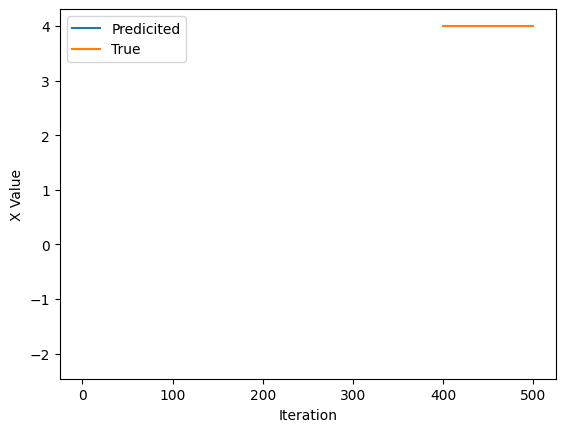

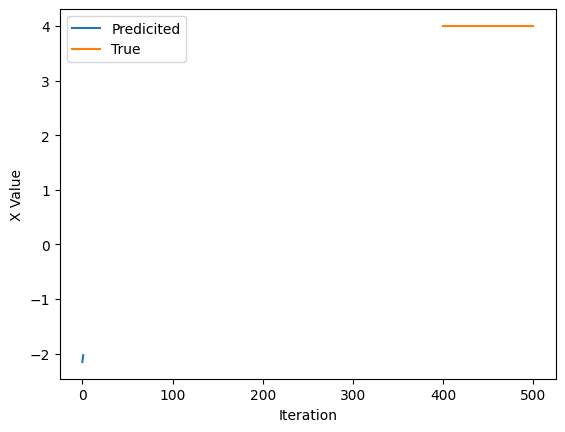

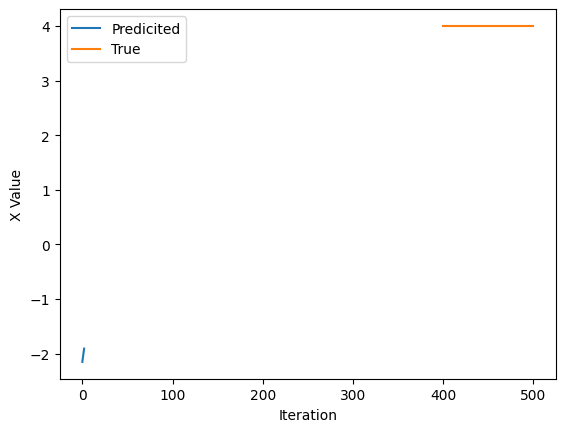

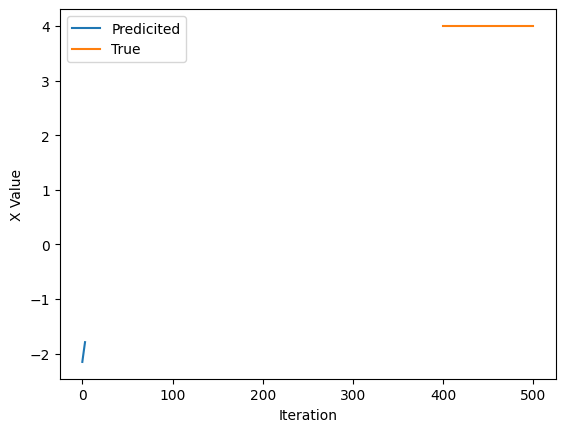

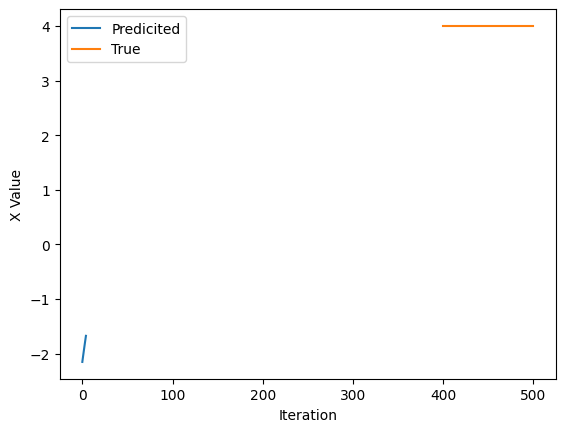

...

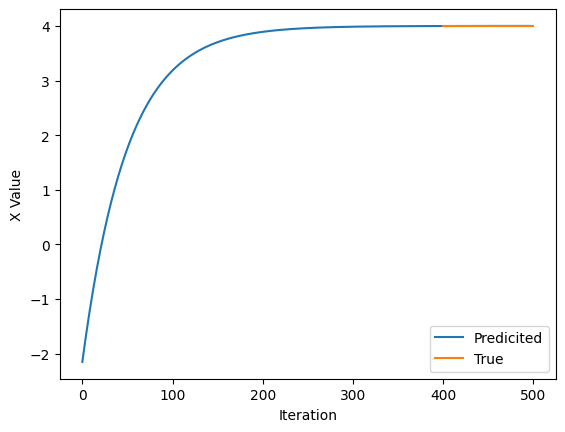

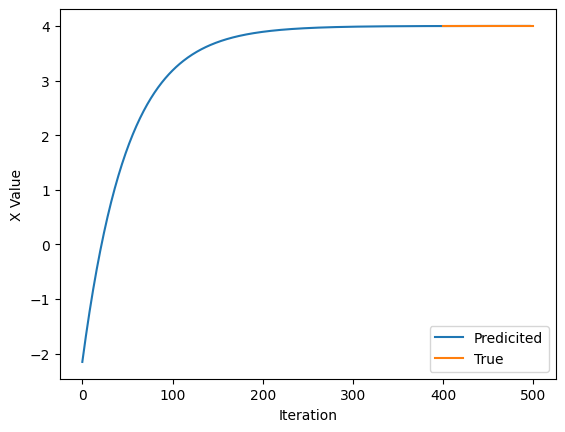

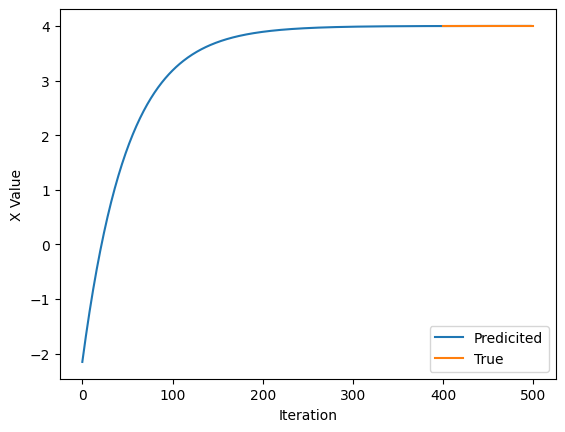

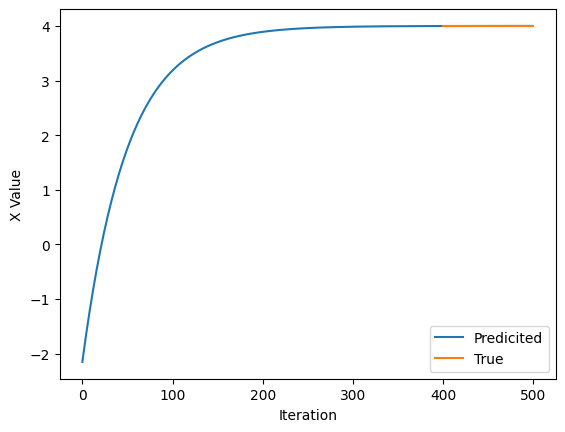

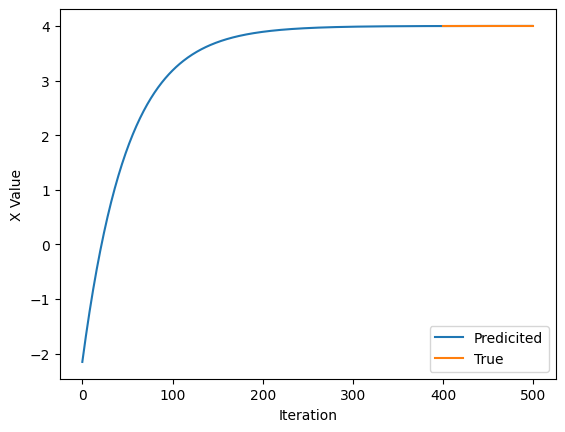

In [ ]:
# Function minimization with autograd and gradient descent #

# Initialize a random value for our intial x

x=torch.randn(1)

print(f"Initializingx={x.item()}")

learning_rate=1e-2  #Learning Rate
history=[]
x_f=4   #Target Value

for i in range(500):
  x=torch.tensor([x],requires_grad=True)

  #Compute the loss as the square of the difference between x and x_f
  loss=(x-x_f)**2

  #Backpropagate through the loss to compute gradients
  loss.backward()

  # Update x with gradient descent
  x=x.item()-learning_rate*x.grad

  history.append(x.item())

## Plot the evolution of x as we optimize toward x_f!
  plt.plot(history)
  plt.plot([0,500],[x_f,x_f])
  plt.legend(('Predicited','True'))
  plt.xlabel('Iteration')
  plt.ylabel('X Value')
  plt.show()